# Repeat previous analysis with pairwiseCopying instead of vicsek

In [1]:
from typing import List
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import os
import pyro
import pyro.distributions as dist
import pyro.optim as optim
import seaborn as sns
import torch
from pyro.infer import SVI, Predictive, Trace_ELBO
from pyro.infer.autoguide import AutoMultivariateNormal, init_to_mean
import plotly.express as px
import collab.foraging.toolkit as ft

from collab.utils import find_repo_root
root = find_repo_root()
import logging
import time

logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(message)s")
derivation_logger = logging.getLogger(__name__)

# Hyperparameters for each fish age

In [2]:
exp_names = ["2wpf_091522_3", "4wpf_060222_5", "6wpf_091522_2", "8wpf_070122_1"]
arena_size = [150,300,300,300] #in mm

# params for discretization 
frame_spacing = [120,40,40,20]
grid_size = [150,150,150,150]

# local windows
window_size = 5 #grid units
sampling_fraction = 0.6

# grid constraint
def circular_constraint_func(grid, c_x, c_y, R):
    ind = ((grid["x"] - c_x) ** 2 + (grid["y"] - c_y) ** 2) < R**2
    return grid.loc[ind]

# interaction length (same for all predictors)
L = 50 # units : mm. Note that numerical value may differ for each age after unit conversion

# velocity predictors
sigma_v = 4 # units : mm/frame_spacing, i.e. we only need to convert length units. Numerical value may be different for each age after unit conversion!
sigma_t = 1 # units : rds. Same for all ages

# proximity predictor parameters. These are different for each age as they scale with bodylength!
# need to convert these values from mm to grid units!
repulsion_radius = [4, 7, 10, 12] #mm
optimal_proximity = [6, 10.5, 15, 18] #mm
proximity_decay = 0.1 #(mm)^-1

# score_kwargs
decay_length = 2 #grid units

# Generate predictors

In [3]:
def get_derivedDF(exp : str, exp_index : int):
    print("-"*50)
    print(f"Computing derivedDF for experiment: {exp}")
    print("-"*50)
    start = time.time()
    raw_data = pd.read_csv(
        os.path.join(
            root,
            f"data/foraging/fish/{exp}.csv",
        )
    )

    # generate data object after subsampling
    processed_data = ft.rescale_to_grid(ft.subsample_frames_constant_frame_rate(raw_data, frame_spacing=frame_spacing[exp_index]), gridMax=arena_size[exp_index], size=grid_size[exp_index])
    object = ft.dataObject(foragersDF=processed_data, grid_size=grid_size[exp_index])

    # create dictionaries for predictor/score kwargs by changing to appropriate units
    length_conversion = grid_size[exp_index]/arena_size[exp_index] #grid_units / mm

    grid_constraint_params = {
        "c_x": grid_size[exp_index]/ 2,
        "c_y": grid_size[exp_index]/ 2,
        "R": grid_size[exp_index]/ 2,
    }

    predictor_kwargs = {
        "proximity": {
            "interaction_length": L * length_conversion,
            "optimal_distance": optimal_proximity[exp_index] * length_conversion,
            "repulsion_radius": repulsion_radius[exp_index] * length_conversion,
            "proximity_decay": proximity_decay / length_conversion,
        },

        "pairwiseCopying": {
            "interaction_length" : L* length_conversion,
            "sigma_v" : sigma_v * length_conversion,
            "sigma_t" : sigma_t,
            "dt" : 1
        },

        "velocityDiffusion": {
            "sigma_v" : sigma_v * length_conversion,
            "sigma_t" : sigma_t,
            "dt" : 1
        }
    }

    local_windows_kwargs = {
        "window_size": window_size,
        "sampling_fraction": sampling_fraction,
        "skip_incomplete_frames": True,
        "grid_constraint" : circular_constraint_func,
        "grid_constraint_params" : grid_constraint_params

    }

    score_kwargs = {
        "nextStepExponential": {
                "decay_length" : decay_length
            }
    }

    derivedDF = ft.derive_predictors_and_scores(
        object,
        local_windows_kwargs,
        predictor_kwargs=predictor_kwargs,
        score_kwargs=score_kwargs,
        dropna=True,
        add_scaled_values=True
        )
    end = time.time()
    print("\n\n")
    derivation_logger.info(f"Experiment {exp} completed in {end-start:.2f} seconds.")
    return derivedDF

In [4]:
exp_wise_derivedDF = {}

for i,exp in enumerate(exp_names):
    derivedDF = get_derivedDF(exp_index=i, exp=exp)

    exp_wise_derivedDF[exp] = derivedDF

--------------------------------------------------
Computing derivedDF for experiment: 2wpf_091522_3
--------------------------------------------------
original_frames: 36107
original_shape: (144428, 4)
resulting_frames: 301
resulting_shape: (1204, 4)


/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/utils.py:42: UserWarning: 
                NaN values in data. The default behavior of predictor/score generating functions is
                to ignore foragers with missing positional data. To modify, see documentation of
                `derive_predictors_and_scores` and `generate_local_windows`
                
  warnings.warn(
2024-12-17 22:58:37,908 - Local windows completed in 10.00 seconds.
2024-12-17 22:58:48,875 - proximity completed in 10.97 seconds.
2024-12-17 22:59:08,452 - pairwiseCopying completed in 19.58 seconds.
2024-12-17 22:59:18,256 - velocityDiffusion completed in 9.80 seconds.
2024-12-17 22:59:21,141 - nextStepExponential completed in 2.88 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning: 
                      Dropped 3762/51731 (~7.27%) rows from `derivedDF`
                      due to NaN values. Missing values can arise 




--------------------------------------------------
Computing derivedDF for experiment: 4wpf_060222_5
--------------------------------------------------
original_frames: 18739
original_shape: (74956, 4)
resulting_frames: 469
resulting_shape: (1876, 4)


2024-12-17 22:59:39,987 - Local windows completed in 17.83 seconds.
2024-12-17 22:59:57,020 - proximity completed in 17.03 seconds.
2024-12-17 23:00:30,203 - pairwiseCopying completed in 33.18 seconds.
2024-12-17 23:00:48,363 - velocityDiffusion completed in 18.16 seconds.
2024-12-17 23:00:53,619 - nextStepExponential completed in 5.25 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning: 
                      Dropped 438/101034 (~0.43%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend on next/previous positions
                      that are unavailable. See documentation of the corresponding predictor/score generating functions
                      for more information.
                      
  warnings.warn(
2024-12-17 23:00:54,866 - derivedDF generated in 1.25 seconds.
2024-12-17 23:00:54,868 - Experiment 4wpf_060222_5 completed in 92.80 seconds.





--------------------------------------------------
Computing derivedDF for experiment: 6wpf_091522_2
--------------------------------------------------
original_frames: 36779
original_shape: (147116, 4)
resulting_frames: 920
resulting_shape: (3680, 4)


2024-12-17 23:01:30,542 - Local windows completed in 35.34 seconds.
2024-12-17 23:02:13,194 - proximity completed in 42.65 seconds.
2024-12-17 23:03:26,303 - pairwiseCopying completed in 73.11 seconds.
2024-12-17 23:04:05,629 - velocityDiffusion completed in 39.32 seconds.
2024-12-17 23:04:17,464 - nextStepExponential completed in 11.83 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning: 
                      Dropped 391/196840 (~0.20%) rows from `derivedDF`
                      due to NaN values. Missing values can arise when computations depend on next/previous positions
                      that are unavailable. See documentation of the corresponding predictor/score generating functions
                      for more information.
                      
  warnings.warn(
2024-12-17 23:04:20,079 - derivedDF generated in 2.61 seconds.
2024-12-17 23:04:20,080 - Experiment 6wpf_091522_2 completed in 205.04 seconds.





--------------------------------------------------
Computing derivedDF for experiment: 8wpf_070122_1
--------------------------------------------------
original_frames: 37226
original_shape: (148904, 4)
resulting_frames: 1862
resulting_shape: (7448, 4)


/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/utils.py:42: UserWarning: 
                NaN values in data. The default behavior of predictor/score generating functions is
                to ignore foragers with missing positional data. To modify, see documentation of
                `derive_predictors_and_scores` and `generate_local_windows`
                
  warnings.warn(
2024-12-17 23:05:29,926 - Local windows completed in 69.40 seconds.
2024-12-17 23:07:04,542 - proximity completed in 94.62 seconds.
2024-12-17 23:10:08,079 - pairwiseCopying completed in 183.54 seconds.
2024-12-17 23:11:14,785 - velocityDiffusion completed in 66.71 seconds.
2024-12-17 23:11:28,955 - nextStepExponential completed in 14.17 seconds.
/Users/palka/Documents/Repositories/collab-creatures/collab/foraging/toolkit/derive.py:64: UserWarning: 
                      Dropped 1357/401974 (~0.34%) rows from `derivedDF`
                      due to NaN values. Missing values can ar

# Model

In [5]:
class FishModel(pyro.nn.PyroModule):
    def __init__(self, predictors: dict, score: dict):
        super().__init__()

        self.predictors = predictors
        self.score = score
        self.n = len(score)

    def forward(self, predictors=None, score=None):
        if predictors is None:
            predictors = self.predictors

        size = len(next(iter(predictors.values())))

        weights = {}
        sigmas = {}
        for key in predictors.keys():
            weights[key] = pyro.sample(f"weight_{key}", dist.Normal(0.0, 1))
            sigmas[key] = pyro.sample(f"sigma_{key}", dist.Exponential(10.0))

        weights["b"] = pyro.sample("b", dist.Normal(0.5, 0.3))
        sigmas["bs"] = pyro.sample("bs", dist.Exponential(10.0))

        with pyro.plate("data", size):
            sigma = pyro.deterministic(
                "sigma",
                sum([predictors[key] * sigmas[key] for key in predictors.keys()])
                + sigmas["bs"],
            )

            sigma = torch.nn.functional.softplus(sigma) #since proximity predictor can be negative!

            assert torch.all(sigma > 0), "Sigma is not positive"

            mean = pyro.deterministic(
                "mean",
                sum([predictors[key] * weights[key] for key in predictors.keys()])
                + weights["b"],
            )

            observed_score = None
            if score is not None:
                observed_score = next(iter(score.values())) # gets the values without knowing the key ie score name

            pyro.sample("predicted_score", dist.Normal(mean, sigma), obs=observed_score)

# Helper functions for inference, model evaluation and visualization

In [6]:
def get_tensors_for_inference(
    derivedDF: pd.DataFrame, predictor_names: List[str], score_names: List[str]
):
    predictors = {}
    for name in predictor_names:
        predictors[name] = torch.tensor(derivedDF[name].values)

    scores = {}
    for name in score_names:
        scores[name] = torch.tensor(derivedDF[name].values)

    return predictors, scores

def run_svi_and_get_samples(
    model, predictors, score, num_svi_iters=600, verbose=False, num_samples=1000
):
    guide = AutoMultivariateNormal(model, init_loc_fn=init_to_mean)
    svi = SVI(model, guide, optim.Adam({"lr": 0.01}), loss=Trace_ELBO())

    iterations = []
    losses = []

    logging.info(f"Starting SVI inference with {num_svi_iters} iterations.")
    start_time = time.time()
    pyro.clear_param_store()
    for i in range(num_svi_iters):
        elbo = svi.step(predictors=predictors, score=score)
        iterations.append(i)
        losses.append(elbo)
        if i % 200 == 0:
            logging.info("Step {}, elbo loss: {}".format(i, elbo))
    end_time = time.time()
    elapsed_time = end_time - start_time
    logging.info("SVI inference completed in %.2f seconds.", elapsed_time)

    if verbose:
        fig = px.line(
            x=iterations, y=losses, title="ELBO loss", template="presentation"
        )
        labels = {"iterations": "iteration", "losses": "loss"}
        fig.update_xaxes(showgrid=False, title_text=labels["iterations"])
        fig.update_yaxes(showgrid=False, title_text=labels["losses"])
        fig.update_layout(width=700)
        fig.show()

    site_names = [f"weight_{key}" for key in predictors.keys()]
    predictive = Predictive(
        model=model,
        guide=guide,
        num_samples=num_samples,
        parallel=False,
        return_sites=site_names,
    )
    samples = predictive(predictors=predictors, score=score)
    return guide, samples

# getting score predictions is slower. only do that for a fraction of datapoints
# and fewer samples!
def evaluate_performance(
    model, guide, predictors, score, num_samples=100, sampling_fraction=1
):
    score_name = next(iter(score.keys()))

    sub_size = int(score[score_name].size(0) * sampling_fraction)
    randinds = torch.randint(0, score[score_name].size(0), (sub_size,))

    # downsample predictors and score
    score_sub = {score_name: score[score_name][randinds]}

    predictors_sub = {}
    for key, value in predictors.items():
        predictors_sub[key] = value[randinds]

    predictive = Predictive(
        model=model,
        guide=guide,
        num_samples=num_samples,
        parallel=False,
        return_sites=["predicted_score"],
    )
    samples = predictive(predictors=predictors_sub, score=None)

    predictions = samples["predicted_score"]

    predictions_mean = predictions.mean(dim=0)
    predictions_lower = predictions.quantile(0.025, dim=0)
    predictions_upper = predictions.quantile(0.975, dim=0)

    coverage = (
        (
            (predictions_lower <= score_sub[score_name])
            & (score_sub[score_name] <= predictions_upper)
        )
        .float()
        .mean()
    )

    observed_mean = score_sub[score_name].mean()

    residuals = score_sub[score_name] - predictions_mean

    mae = (torch.abs(residuals)).mean()

    rsquared = 1 - (
        torch.sum(residuals**2)
        / torch.sum((score_sub[score_name] - observed_mean) ** 2)
    )

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    heatmap = ax[0].hexbin(
        score_sub[score_name],
        predictions_mean,
        gridsize=100,
        cmap="Blues",
        norm=mpl.colors.LogNorm(),
    )
    fig.colorbar(heatmap, ax=ax[0])
    ax[0].set_title("Ratio of outcomes within 95% CI: {:.2f}".format(coverage.item()))
    ax[0].set_xlabel("observed values")
    ax[0].set_ylabel("mean predicted values")

    ax[1].hist(residuals.detach().numpy(), bins=50)
    ax[1].set_title(f"Residuals, MAE: {mae.item():.2f}, R²: {rsquared.item():.2f}")
    ax[1].set_xlabel("residuals")
    ax[1].set_ylabel("count")

    # print(f"Residuals, MAE: {mae.item():.2f}, R²: {rsquared.item():.2f}")

    plt.tight_layout(rect=(0, 0, 1, 0.96))
    sns.despine()
    fig.suptitle("Model evaluation", fontsize=16)
    plt.show()


def plot_density(predictors, scores, title):
    n_plots = len(predictors) * len(scores)
    #print(n_plots)
    ncols = 3
    nrows = np.ceil(n_plots / ncols).astype(int)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3 * nrows))

    plot_index = 0
    for i, predictor_name in enumerate(predictors.keys()):
        for j, score_name in enumerate(scores.keys()):

            if nrows > 1:
                r = plot_index // ncols
                c = plot_index % ncols
                #print([r,c])
                ax = axes[r, c]
            else:
                ax = axes[plot_index]

            heatmap = ax.hexbin(
                predictors[predictor_name],
                scores[score_name],
                gridsize=100,
                cmap="Blues",
                norm=mpl.colors.LogNorm(),
            )
            fig.colorbar(heatmap, ax=ax)
            ax.set_xlabel(f"{predictor_name} predictor")
            ax.set_ylabel(f"{score_name} score")
            # ax.set_aspect("equal")
            plot_index += 1

    # remove unused plots
    if n_plots % ncols:
        for ind in range(n_plots % ncols, ncols):
            if nrows > 1:
                fig.delaxes(axes[nrows-1,ind])
            else:
                fig.delaxes(axes[ind])

    fig.suptitle(title)
    fig.tight_layout()


def plot_distributions(derivedDF, column_names, title):
    fig, ax = plt.subplots(1, len(column_names), figsize=(3 * len(column_names), 3))

    for i, column in enumerate(column_names):
        ax[i].hist(derivedDF[column], bins=20, density=True, alpha=1)
        ax[i].set_yscale("log")
        ax[i].set_ylim([10**-3, 10**2])
        ax[i].set_xlabel(column)
        ax[i].set_ylabel("PDF")

    fig.suptitle(title)
    fig.tight_layout()

# Inference using raw predictors and scores

In [7]:
score_names = ["nextStepExponential"]
predictor_names = ["proximity", "pairwiseCopying", "velocityDiffusion"]

### Visualize the predictors and scores for each age

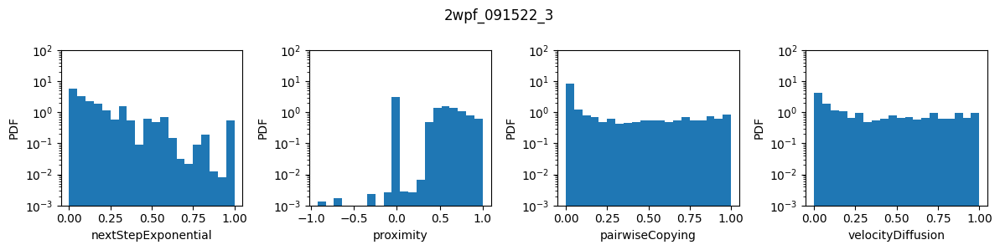

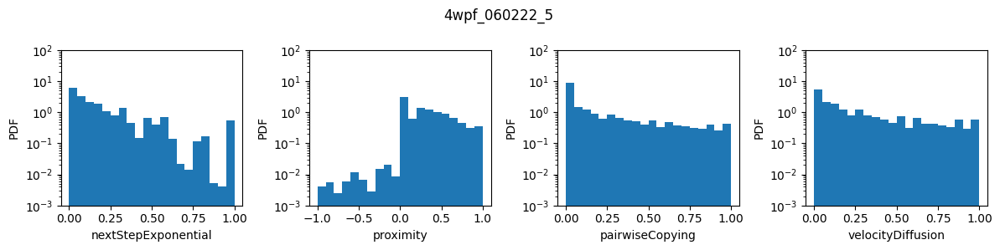

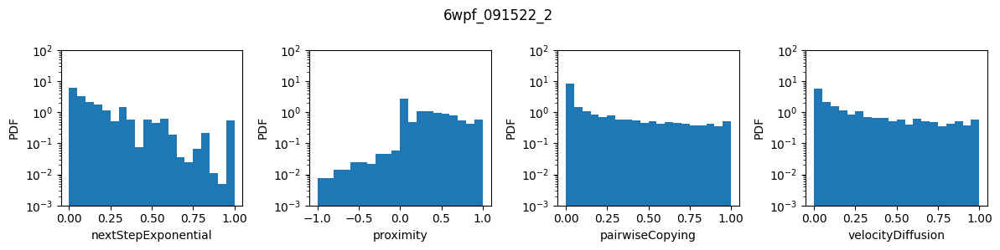

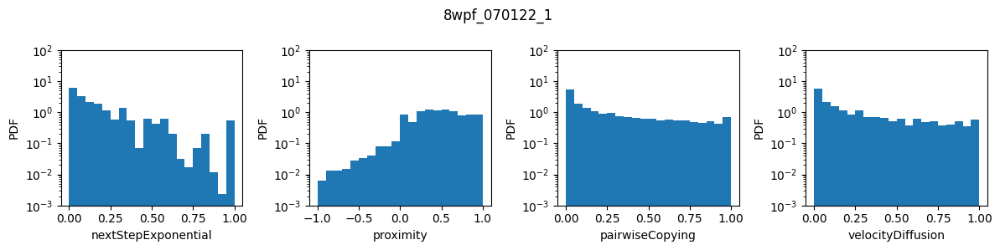

In [8]:
for exp in exp_names:
    plot_distributions(exp_wise_derivedDF[exp], score_names + predictor_names,title=exp)

### Perform inference and save coefficient samples for each age

In [9]:
coefficients_raw = {}

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-17 23:11:47,245 - Starting SVI inference with 1000 iterations.
2024-12-17 23:11:47,314 - Step 0, elbo loss: 39403.66252512996
2024-12-17 23:11:51,981 - Step 200, elbo loss: 30005.158934052797
2024-12-17 23:11:56,241 - Step 400, elbo loss: 29248.34800752256
2024-12-17 23:12:00,688 - Step 600, elbo loss: 28679.312415041164
2024-12-17 23:12:05,058 - Step 800, elbo loss: 28617.67764198861
2024-12-17 23:12:09,501 - SVI inference completed in 22.25 seconds.


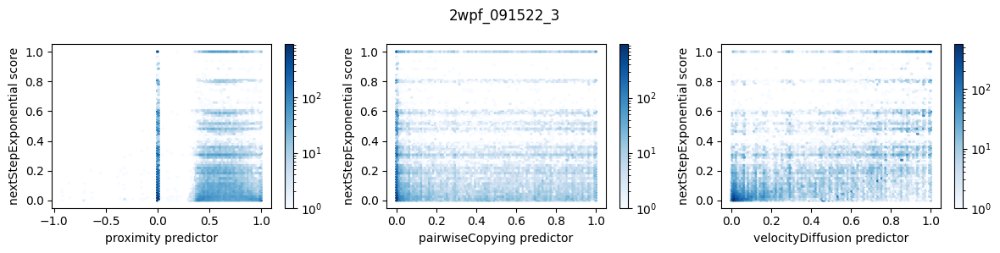

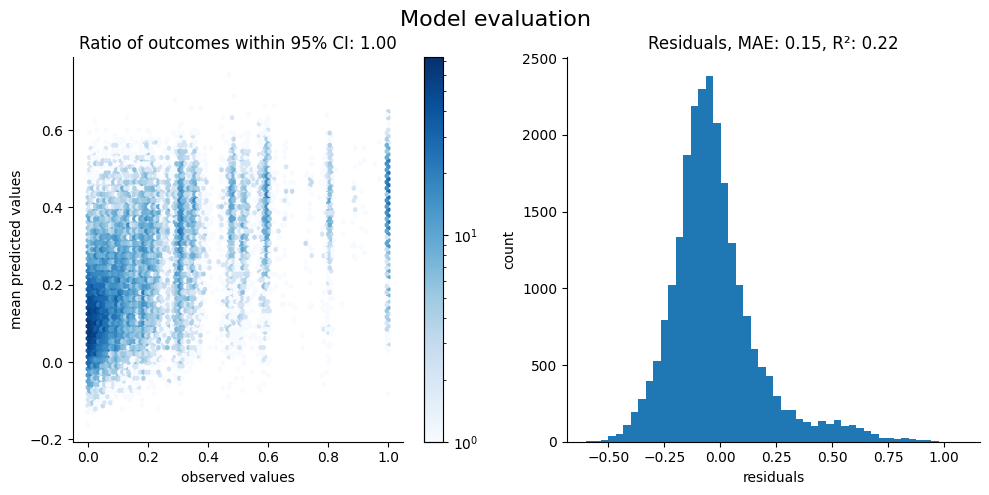

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-17 23:12:26,040 - Starting SVI inference with 1000 iterations.
2024-12-17 23:12:26,075 - Step 0, elbo loss: 74912.76225473674
2024-12-17 23:12:30,591 - Step 200, elbo loss: 62641.9074627196
2024-12-17 23:12:35,843 - Step 400, elbo loss: 60928.17729015156
2024-12-17 23:12:40,379 - Step 600, elbo loss: 60662.33667514918
2024-12-17 23:12:45,216 - Step 800, elbo loss: 60146.224516947026
2024-12-17 23:12:49,843 - SVI inference completed in 23.80 seconds.


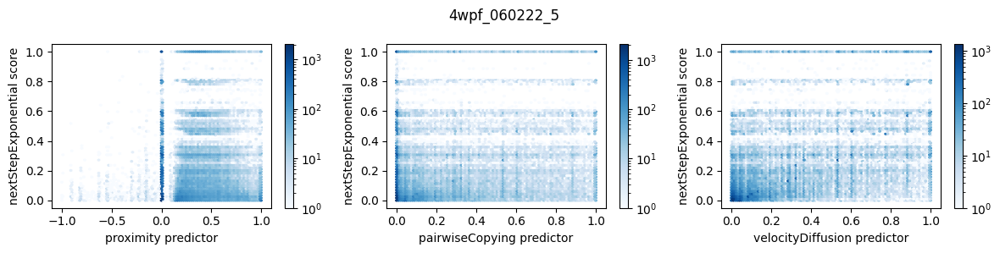

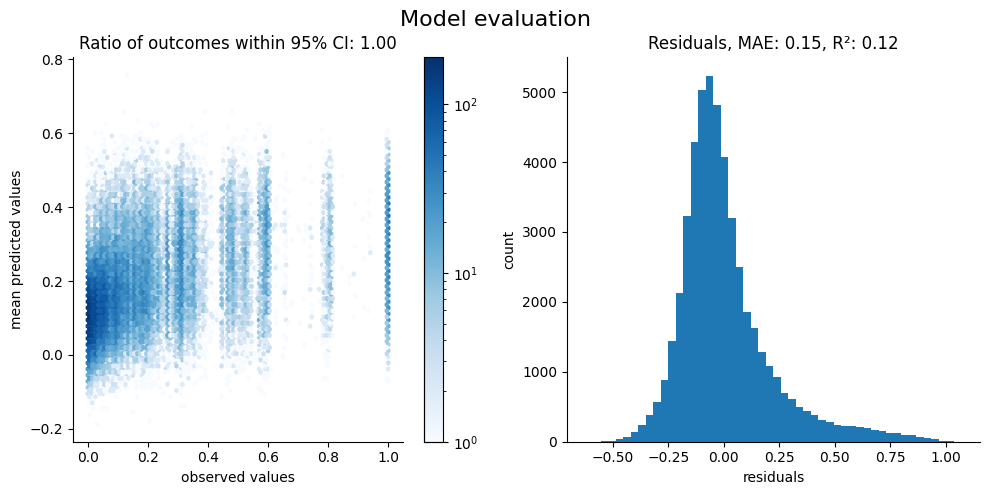

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-17 23:13:10,775 - Starting SVI inference with 1000 iterations.
2024-12-17 23:13:10,819 - Step 0, elbo loss: 177441.38878875162
2024-12-17 23:13:17,048 - Step 200, elbo loss: 120317.24447411248
2024-12-17 23:13:21,794 - Step 400, elbo loss: 117329.88129584346
2024-12-17 23:13:27,155 - Step 600, elbo loss: 116952.31651399171
2024-12-17 23:13:31,641 - Step 800, elbo loss: 115740.88090911126
2024-12-17 23:13:36,188 - SVI inference completed in 25.41 seconds.


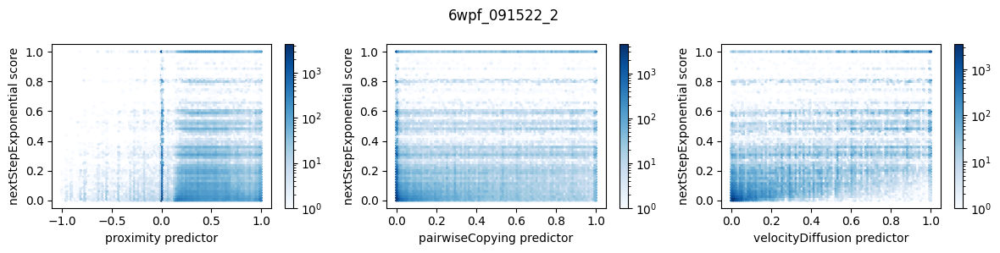

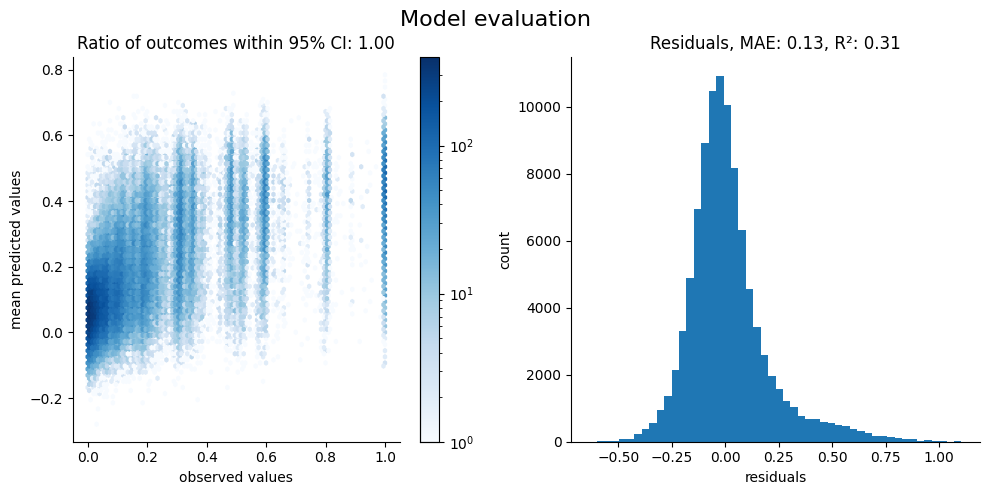

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-17 23:14:02,482 - Starting SVI inference with 1000 iterations.
2024-12-17 23:14:02,638 - Step 0, elbo loss: 324207.4126822622
2024-12-17 23:14:12,212 - Step 200, elbo loss: 248038.91432801474
2024-12-17 23:14:22,034 - Step 400, elbo loss: 238380.16841783476
2024-12-17 23:14:32,277 - Step 600, elbo loss: 236477.123478306
2024-12-17 23:14:41,997 - Step 800, elbo loss: 236087.81949263645
2024-12-17 23:14:52,231 - SVI inference completed in 49.75 seconds.


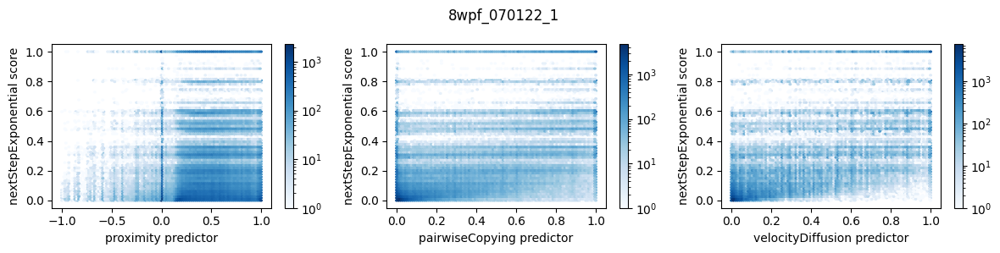

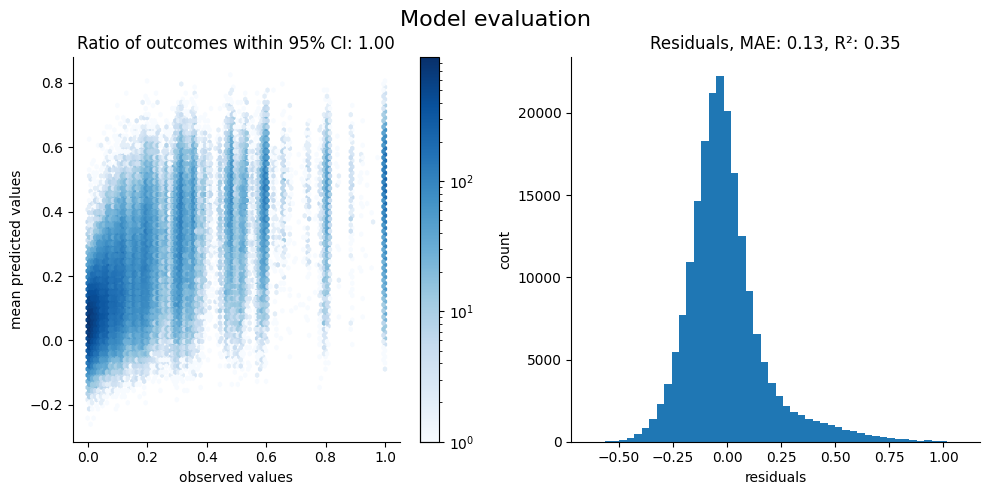

In [10]:
for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using raw predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_raw[exp] = samples

# Repeat for scaled scores

In [11]:
score_names = ["nextStepExponential_scaled"]
predictor_names = ["proximity_scaled", "pairwiseCopying_scaled", "velocityDiffusion_scaled"]

### Visualize the predictors and scores for each age

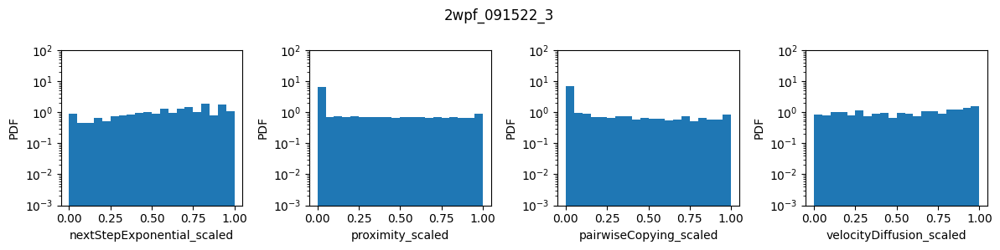

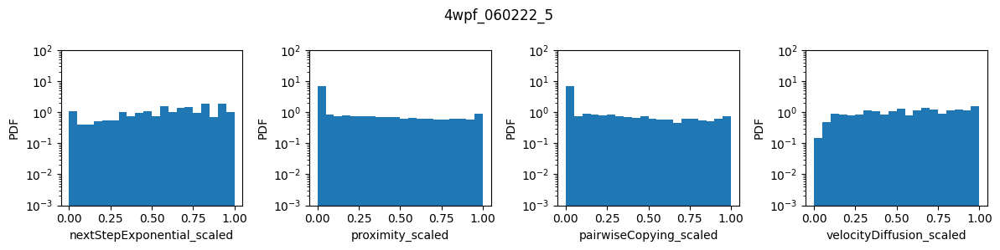

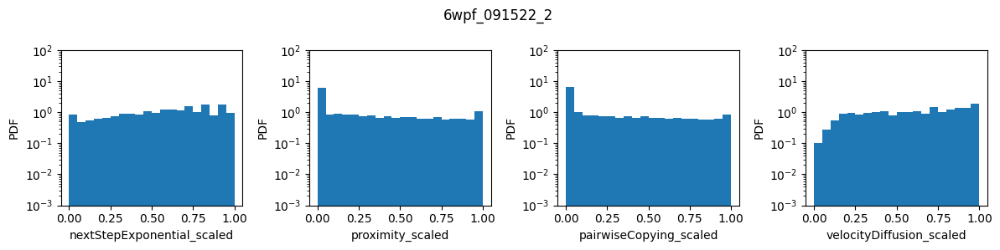

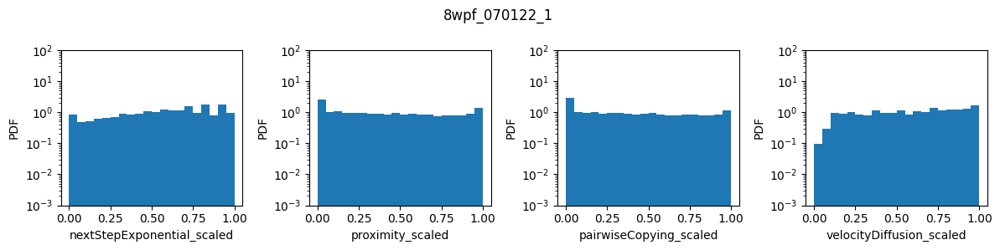

In [12]:
for exp in exp_names:
    plot_distributions(exp_wise_derivedDF[exp], score_names + predictor_names,title=exp)

### Perform inference and save coefficient samples for each age

In [13]:
coefficients_scaled = {}

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-17 23:15:32,178 - Starting SVI inference with 1000 iterations.
2024-12-17 23:15:32,301 - Step 0, elbo loss: 38038.87185901213
2024-12-17 23:15:37,772 - Step 200, elbo loss: 30664.37480405335
2024-12-17 23:15:42,178 - Step 400, elbo loss: 29810.010468660515
2024-12-17 23:15:46,953 - Step 600, elbo loss: 29438.140667016436
2024-12-17 23:15:51,423 - Step 800, elbo loss: 29377.824780575706
2024-12-17 23:15:56,195 - SVI inference completed in 24.02 seconds.


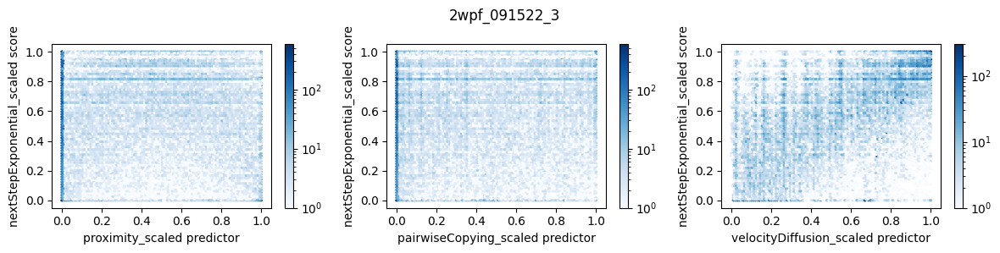

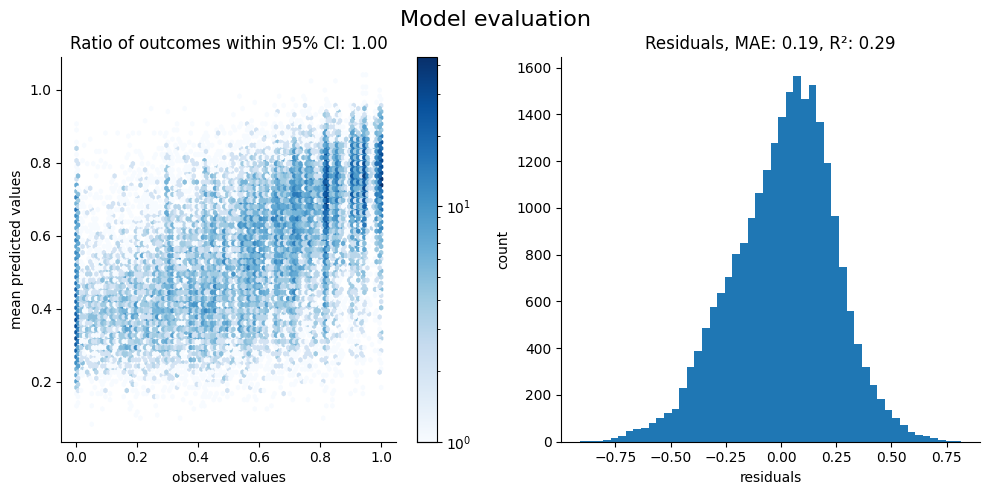

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-17 23:16:12,542 - Starting SVI inference with 1000 iterations.
2024-12-17 23:16:12,590 - Step 0, elbo loss: 82323.67817416515
2024-12-17 23:16:17,366 - Step 200, elbo loss: 65039.12876887518
2024-12-17 23:16:21,868 - Step 400, elbo loss: 63239.279163160325
2024-12-17 23:16:27,339 - Step 600, elbo loss: 62344.520116312124
2024-12-17 23:16:32,131 - Step 800, elbo loss: 62102.64933730902
2024-12-17 23:16:36,932 - SVI inference completed in 24.39 seconds.


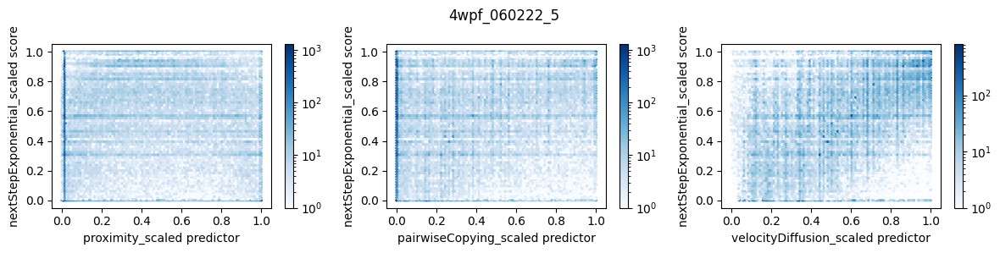

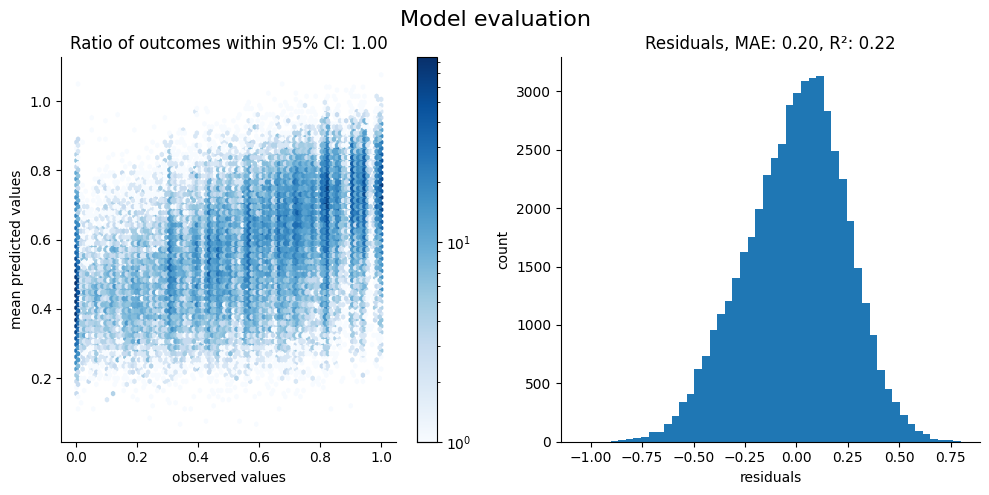

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-17 23:16:58,791 - Starting SVI inference with 1000 iterations.
2024-12-17 23:16:58,885 - Step 0, elbo loss: 175284.6203754805
2024-12-17 23:17:04,881 - Step 200, elbo loss: 124988.27028868547
2024-12-17 23:17:10,930 - Step 400, elbo loss: 120863.7929255523
2024-12-17 23:17:17,434 - Step 600, elbo loss: 119292.09345399658
2024-12-17 23:17:22,051 - Step 800, elbo loss: 118739.1607090038
2024-12-17 23:17:26,596 - SVI inference completed in 27.80 seconds.


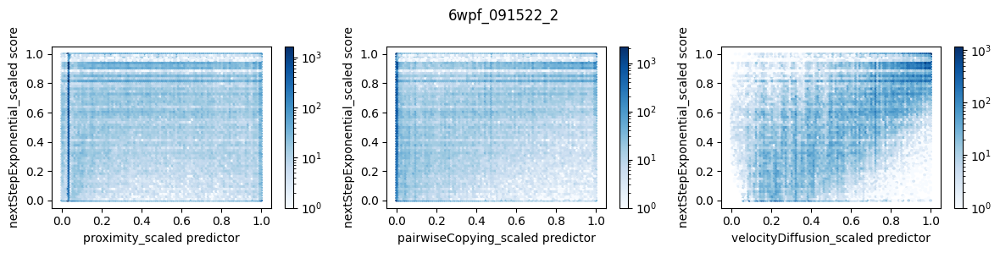

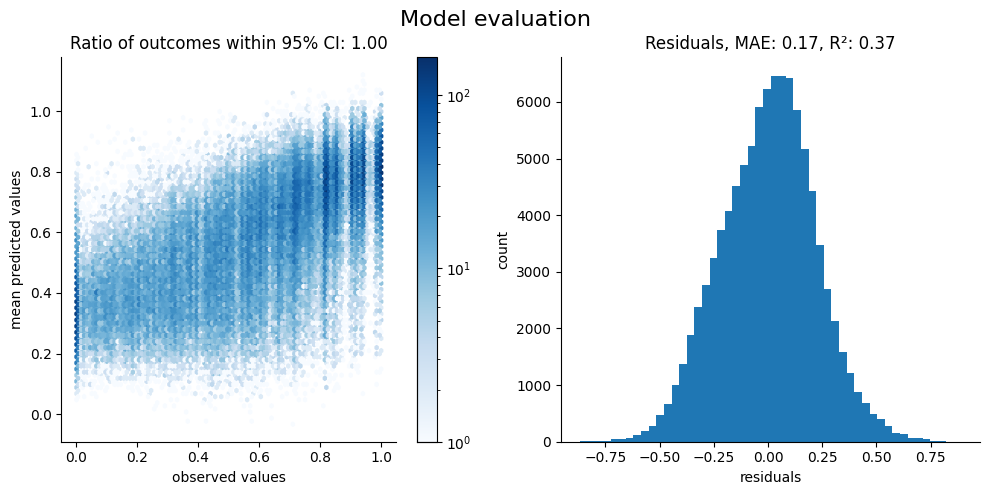

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-17 23:17:58,142 - Starting SVI inference with 1000 iterations.
2024-12-17 23:17:58,283 - Step 0, elbo loss: 324218.5056022294
2024-12-17 23:18:06,884 - Step 200, elbo loss: 254831.91669945308
2024-12-17 23:18:14,795 - Step 400, elbo loss: 244609.5229425694
2024-12-17 23:18:23,294 - Step 600, elbo loss: 242248.46670625574
2024-12-17 23:18:32,472 - Step 800, elbo loss: 241368.42071007664
2024-12-17 23:18:41,470 - SVI inference completed in 43.33 seconds.


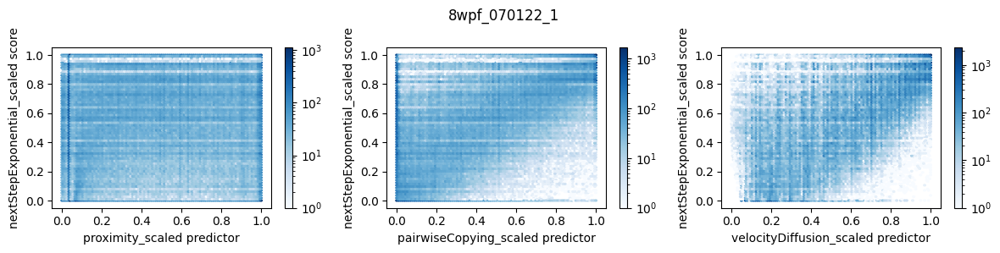

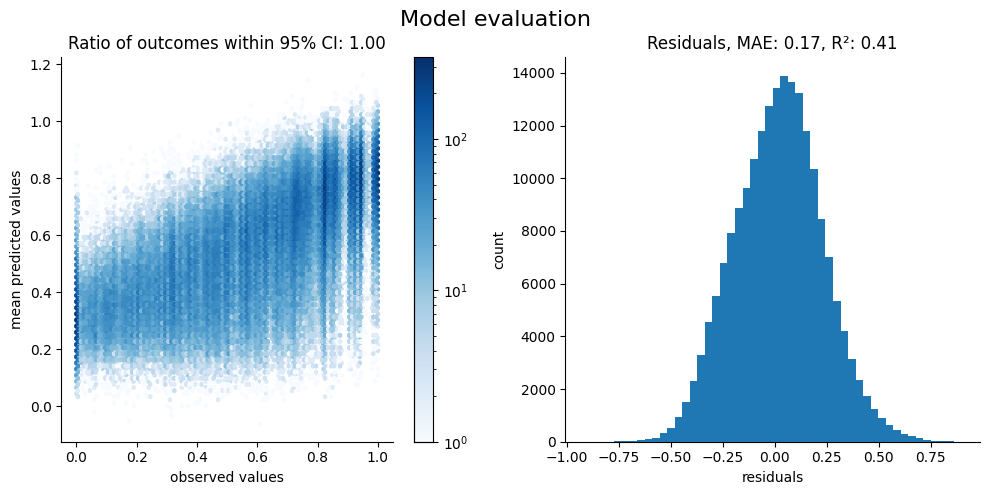

In [14]:
for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using scaled predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_scaled[exp] = samples

## Since big turns are rare in the data, it is possible that the contribution of `proximity` and `pairwiseCopying` are overshadowed by `velocityDiffusion`.
### Repeat above using only the first two predictors

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-17 23:19:07,781 - Starting SVI inference with 1000 iterations.
2024-12-17 23:19:07,935 - Step 0, elbo loss: 41243.81498813369
2024-12-17 23:19:11,940 - Step 200, elbo loss: 30523.653511750497
2024-12-17 23:19:15,382 - Step 400, elbo loss: 29597.920526033457
2024-12-17 23:19:18,360 - Step 600, elbo loss: 29431.981738502043
2024-12-17 23:19:21,666 - Step 800, elbo loss: 29294.501464248187
2024-12-17 23:19:24,642 - SVI inference completed in 16.86 seconds.


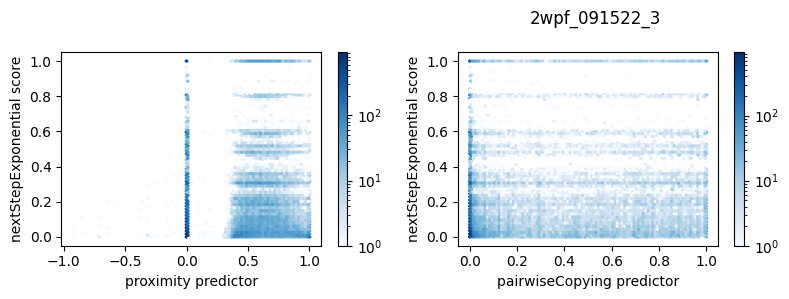

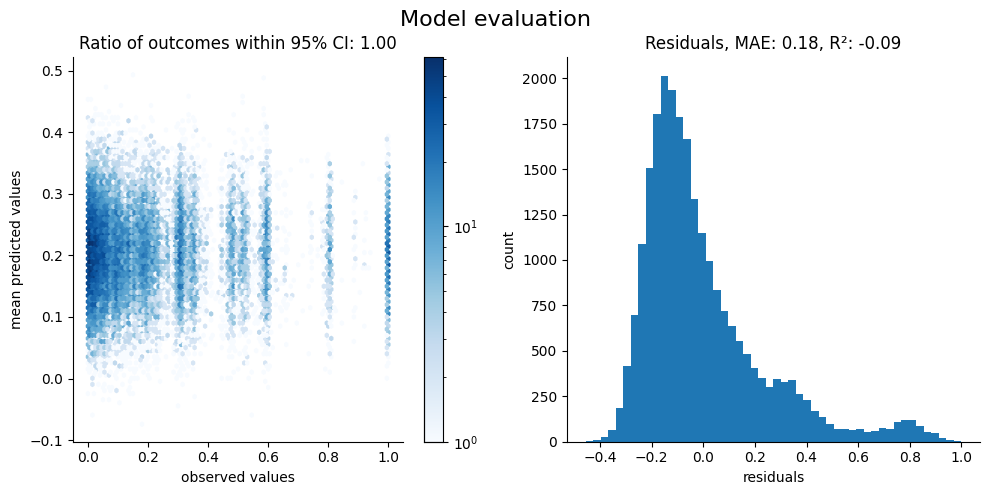

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-17 23:19:34,956 - Starting SVI inference with 1000 iterations.
2024-12-17 23:19:34,981 - Step 0, elbo loss: 77379.17367188552
2024-12-17 23:19:38,988 - Step 200, elbo loss: 63201.381861016656
2024-12-17 23:19:43,267 - Step 400, elbo loss: 61815.51393260723
2024-12-17 23:19:47,403 - Step 600, elbo loss: 61410.06209241314
2024-12-17 23:19:51,617 - Step 800, elbo loss: 61108.89019506211
2024-12-17 23:19:55,976 - SVI inference completed in 21.02 seconds.


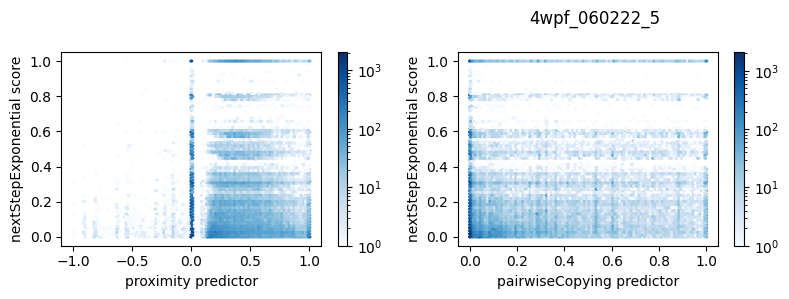

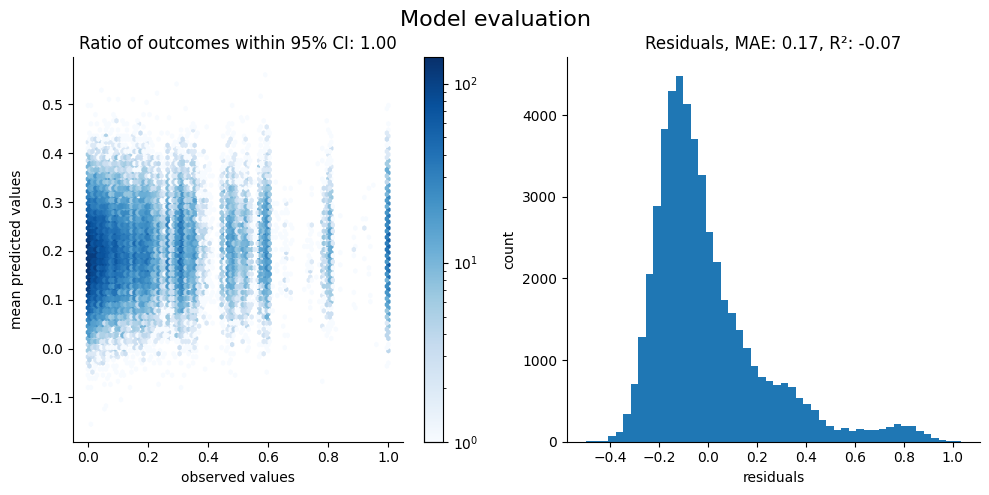

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-17 23:20:13,004 - Starting SVI inference with 1000 iterations.
2024-12-17 23:20:13,044 - Step 0, elbo loss: 142798.62517081344
2024-12-17 23:20:18,212 - Step 200, elbo loss: 122927.40103583699
2024-12-17 23:20:23,554 - Step 400, elbo loss: 120701.53925506989
2024-12-17 23:20:28,538 - Step 600, elbo loss: 119877.69476876018
2024-12-17 23:20:33,607 - Step 800, elbo loss: 119064.26372460712
2024-12-17 23:20:41,017 - SVI inference completed in 28.01 seconds.


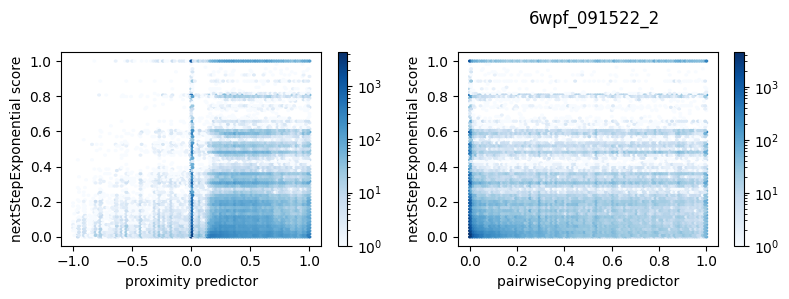

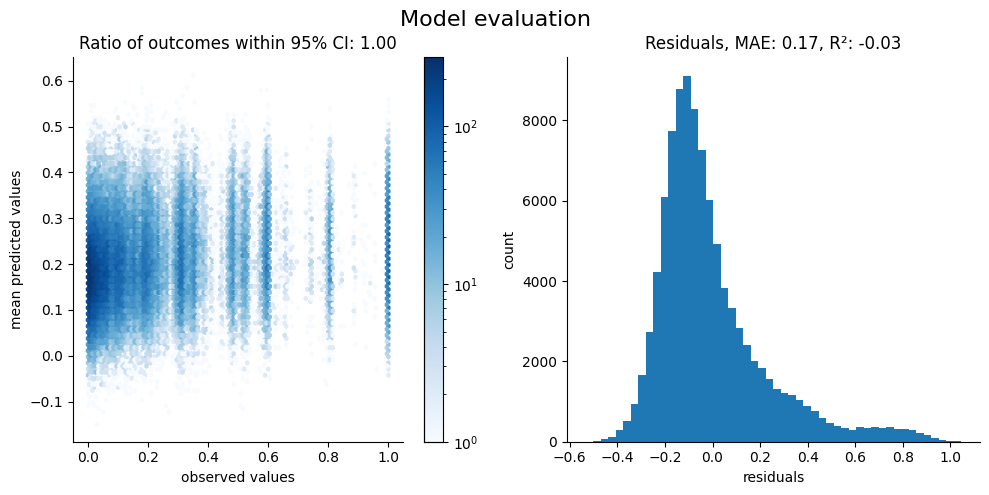

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-17 23:21:05,920 - Starting SVI inference with 1000 iterations.
2024-12-17 23:21:06,003 - Step 0, elbo loss: 359178.259143691
2024-12-17 23:21:15,083 - Step 200, elbo loss: 247283.9688689158
2024-12-17 23:21:22,801 - Step 400, elbo loss: 242369.9077711444
2024-12-17 23:21:30,155 - Step 600, elbo loss: 239476.21818922312
2024-12-17 23:21:36,777 - Step 800, elbo loss: 238893.2136315555
2024-12-17 23:21:44,155 - SVI inference completed in 38.23 seconds.


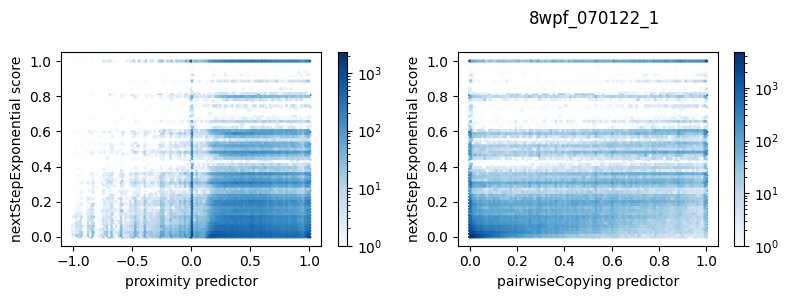

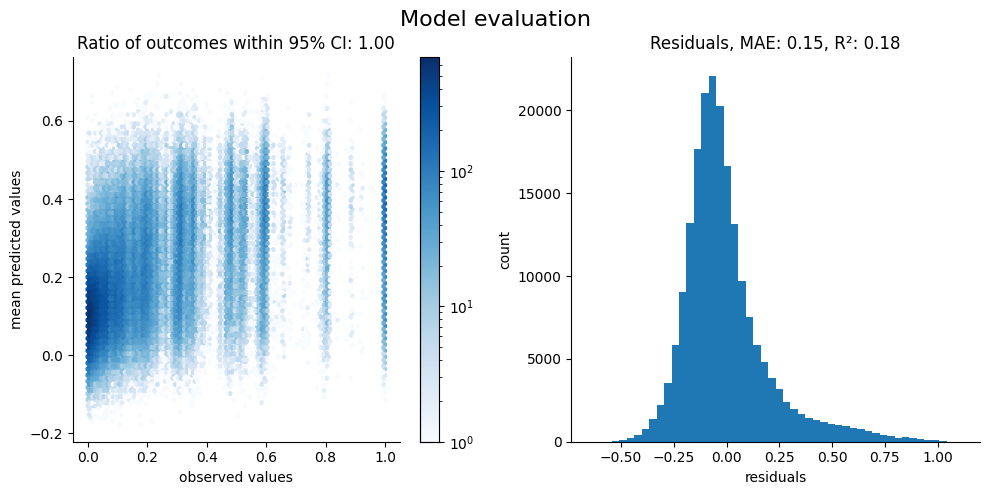

In [15]:
coefficients_raw_no_diffusion = {}
predictor_names = ["proximity", "pairwiseCopying"]
score_names = ["nextStepExponential"]

for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using raw predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_raw_no_diffusion[exp] = samples

--------------------------------------------------
Starting inference : 2wpf_091522_3
--------------------------------------------------


2024-12-17 23:22:03,053 - Starting SVI inference with 1000 iterations.
2024-12-17 23:22:03,077 - Step 0, elbo loss: 36406.75461593049
2024-12-17 23:22:07,137 - Step 200, elbo loss: 31652.62364689223
2024-12-17 23:22:10,996 - Step 400, elbo loss: 30987.414735761835
2024-12-17 23:22:14,932 - Step 600, elbo loss: 30733.099010392172
2024-12-17 23:22:18,754 - Step 800, elbo loss: 30573.982372689014
2024-12-17 23:22:22,642 - SVI inference completed in 19.59 seconds.


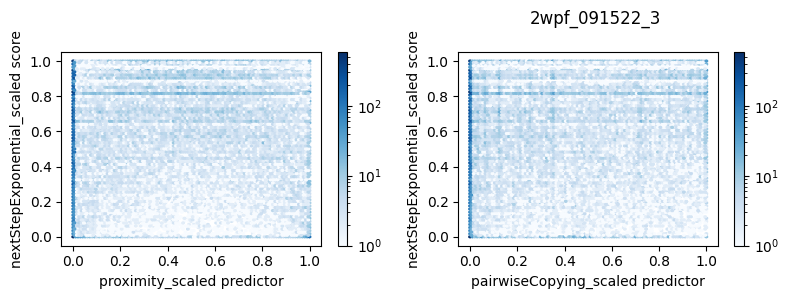

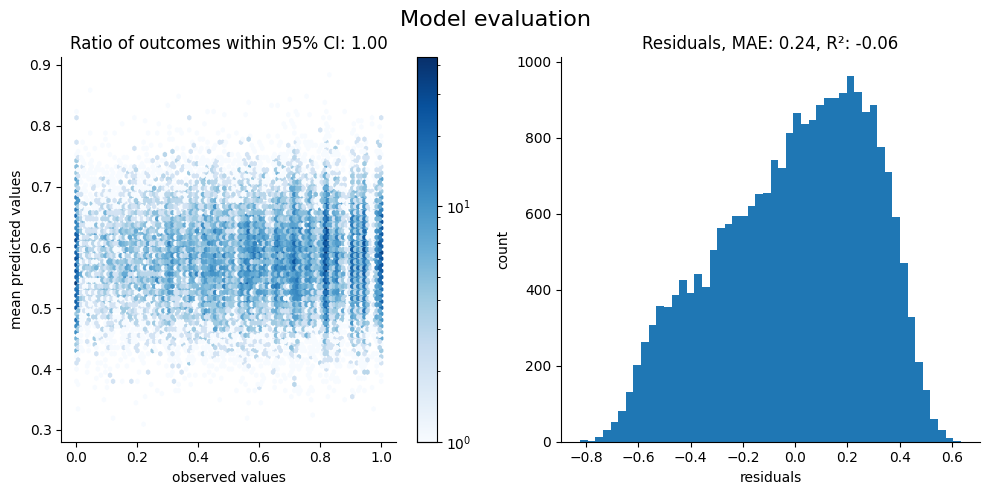

--------------------------------------------------
Starting inference : 4wpf_060222_5
--------------------------------------------------


2024-12-17 23:22:35,992 - Starting SVI inference with 1000 iterations.
2024-12-17 23:22:36,026 - Step 0, elbo loss: 82579.09533053235
2024-12-17 23:22:40,085 - Step 200, elbo loss: 66423.32872714977
2024-12-17 23:22:44,716 - Step 400, elbo loss: 64414.908255849805
2024-12-17 23:22:48,882 - Step 600, elbo loss: 64081.646553981365
2024-12-17 23:22:53,174 - Step 800, elbo loss: 63925.99806086149
2024-12-17 23:22:57,731 - SVI inference completed in 21.74 seconds.


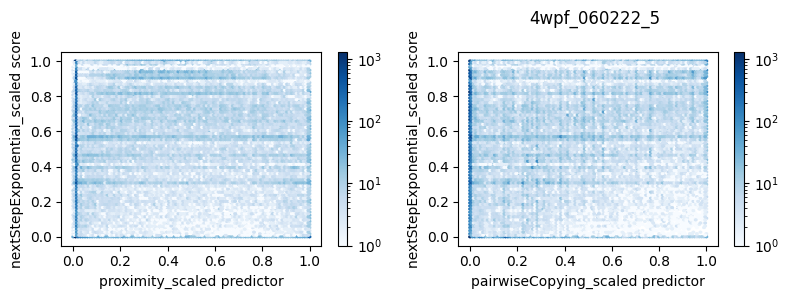

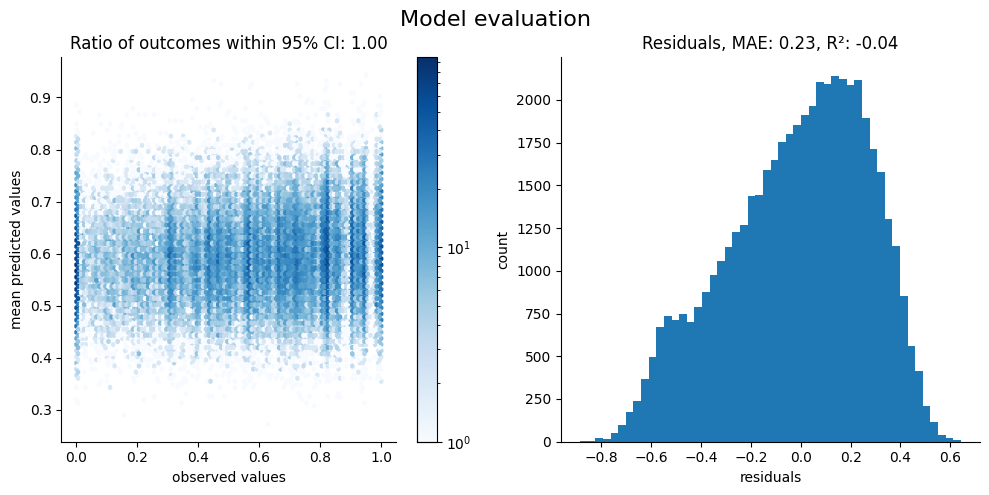

--------------------------------------------------
Starting inference : 6wpf_091522_2
--------------------------------------------------


2024-12-17 23:23:15,518 - Starting SVI inference with 1000 iterations.
2024-12-17 23:23:15,558 - Step 0, elbo loss: 143738.44433999015
2024-12-17 23:23:20,617 - Step 200, elbo loss: 127834.3158383529
2024-12-17 23:23:26,454 - Step 400, elbo loss: 126349.91684798995
2024-12-17 23:23:31,441 - Step 600, elbo loss: 124458.87995427306
2024-12-17 23:23:36,562 - Step 800, elbo loss: 123969.15042263719
2024-12-17 23:23:41,651 - SVI inference completed in 26.13 seconds.


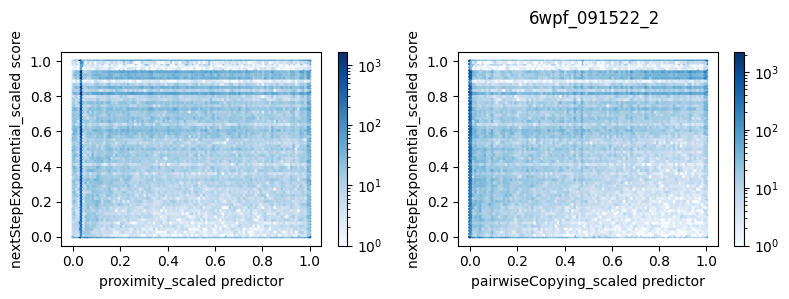

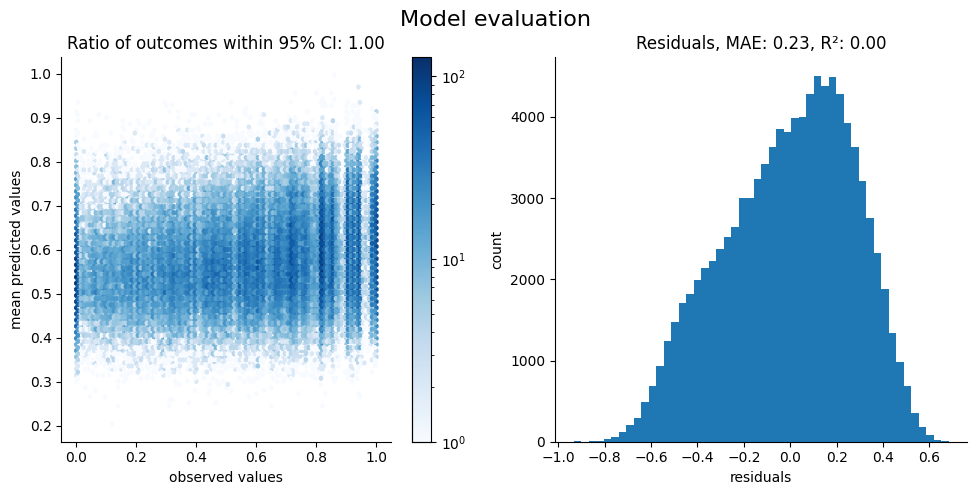

--------------------------------------------------
Starting inference : 8wpf_070122_1
--------------------------------------------------


2024-12-17 23:24:07,676 - Starting SVI inference with 1000 iterations.
2024-12-17 23:24:07,834 - Step 0, elbo loss: 302961.19715531793
2024-12-17 23:24:16,550 - Step 200, elbo loss: 257059.21502118645
2024-12-17 23:24:25,115 - Step 400, elbo loss: 249312.31155525765
2024-12-17 23:24:33,827 - Step 600, elbo loss: 247285.5001375229
2024-12-17 23:24:43,029 - Step 800, elbo loss: 245540.74159734332
2024-12-17 23:24:52,018 - SVI inference completed in 44.34 seconds.


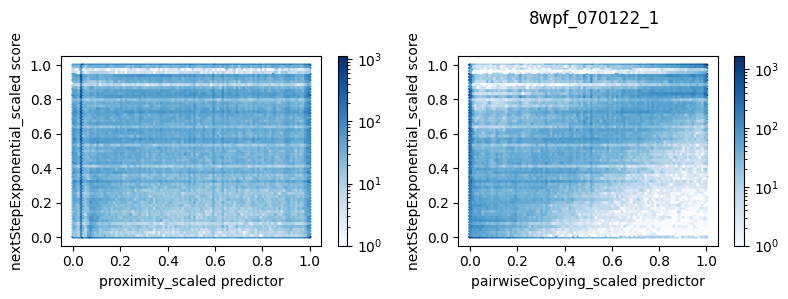

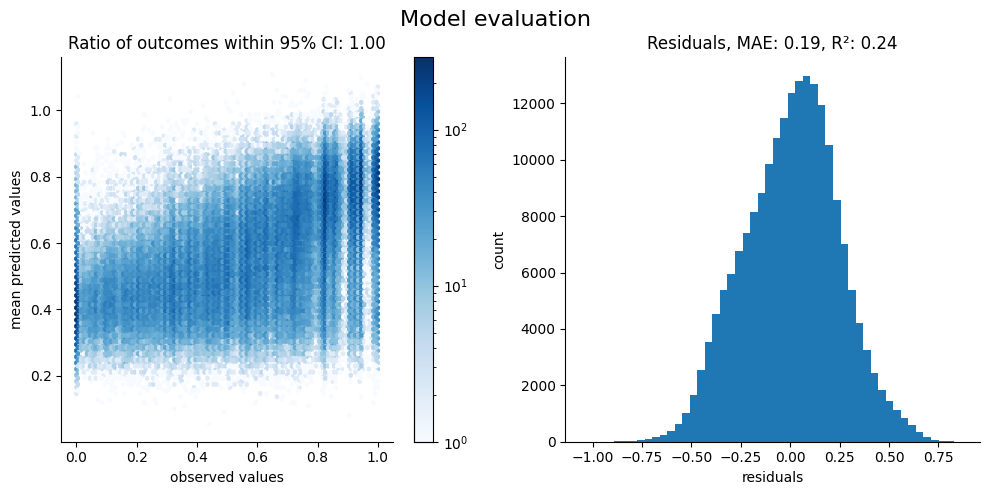

In [16]:
coefficients_scaled_no_diffusion = {}
predictor_names = ["proximity_scaled", "pairwiseCopying_scaled"]
score_names = ["nextStepExponential_scaled"]

for exp in exp_names:
    print("-"*50)
    print(f"Starting inference : {exp}")
    print("-"*50)
    predictors, score = get_tensors_for_inference(
        exp_wise_derivedDF[exp], predictor_names=predictor_names, score_names=score_names
    )
    plot_density(predictors, score, exp)
    
    model = FishModel(predictors, score)
    guide, samples = run_svi_and_get_samples(
        model, predictors, score, verbose=True, num_samples=1000, num_svi_iters=1000
    )
    ft.plot_coefs(samples, f"{exp} - using scaled predictor/score values", nbins=100)

    evaluate_performance(
        model, guide, predictors, score, num_samples=100, sampling_fraction=0.5
    )

    #save samples to dict
    coefficients_scaled_no_diffusion[exp] = samples

In [17]:
def plot_comparative_results(samples,title):
    fig, ax = plt.subplots(1,1, figsize=(5,5))
    ax.axhline(0,linestyle="--",color='k')
    ax.axvline(0,linestyle="--",color='k')

    for exp,sample in samples.items():
        try:
            p = sample["weight_proximity"]
            v = sample["weight_pairwiseCopying"]
        except KeyError:
            p = sample["weight_proximity_scaled"]
            v = sample["weight_pairwiseCopying_scaled"]

        ax.scatter(p,v,alpha=0.3,label=exp,s=5)

    ax.set_xlabel("proximity coefficient")
    ax.set_ylabel("pairwiseCopying coefficient")
    ax.set_xlim([-0.2,0.6])
    ax.set_ylim([-0.2,0.6])
    ax.legend()
    fig.suptitle(title)

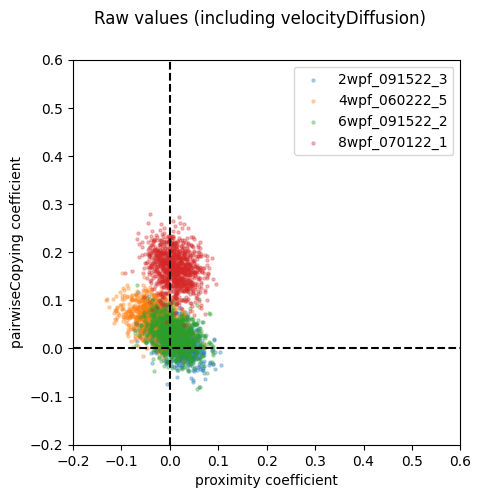

In [18]:
plot_comparative_results(coefficients_raw,"Raw values (including velocityDiffusion)")

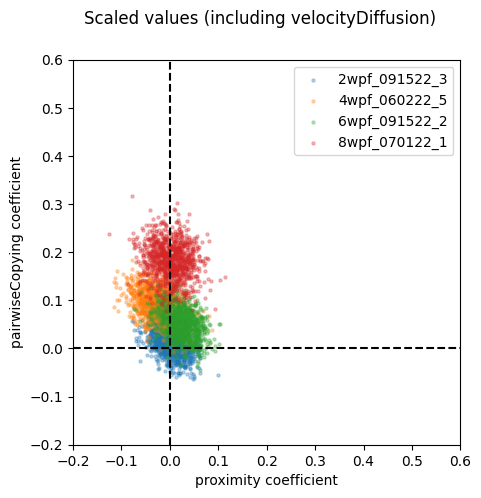

In [19]:
plot_comparative_results(coefficients_scaled,"Scaled values (including velocityDiffusion)")

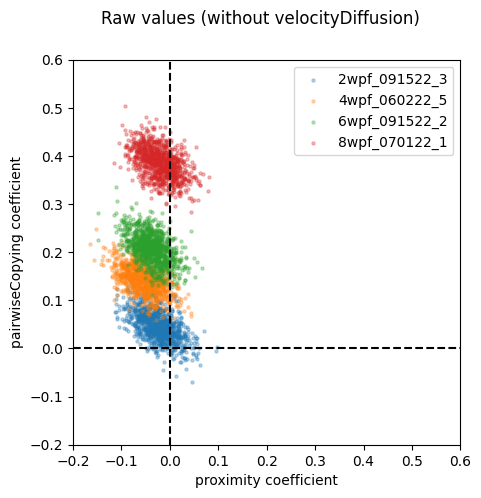

In [20]:
plot_comparative_results(coefficients_raw_no_diffusion,"Raw values (without velocityDiffusion)")

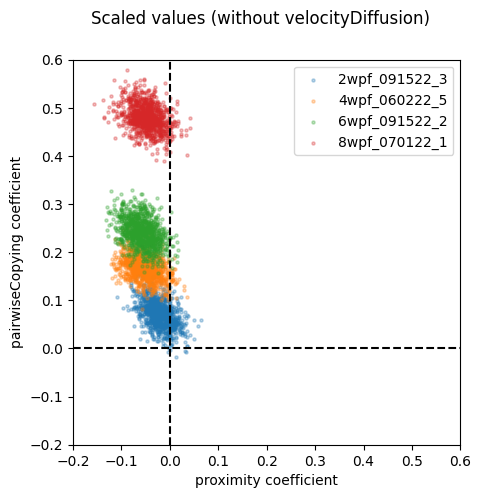

In [21]:
plot_comparative_results(coefficients_scaled_no_diffusion,"Scaled values (without velocityDiffusion)")